# 📌 Submission Guidelines

### ✅ File Naming Rule  
Submit your notebook with the following format:

`StudentID_YourFullName_LABXX.ipynb`

or

`StudentID_YourFullName_LABXX.html`

**Examples (Correct):**
- `21113456_NguyenVanA_LAB01.ipynb`
- `19122233_TranThiB_LAB02.ipynb`

**Examples (Wrong → 0 points):**
- `Lab01.ipynb`
- `YourName.ipynb`
- `20123456.ipynb`
- `Lab01.pdf`

---

### 📌 Grading Policy

- ❌ Wrong filename format, missing submission, or plagiarism (code identical to others) → 0 points

- ⚠️ Submitting a file without results, incomplete work, or only the assignment description → Maximum 4 points

- ✅ Correct filename + Completed results → Graded normally based on assignment quality (accuracy, clarity, and originality)  

### Note:
- AI assistance is allowed, but you must write the code yourself. All submissions will be checked for originality.

---

# Goal

The goal of this lab is to understand how noise affects digital images and how different filtering/denoising methods can be applied to restore image quality.

# Lab Description

Convert Original Image to Noisy Image

- Add artificial noise (e.g.,Impulse noise, Gaussian noise,.. ) to a clean image.

- Observe how noise distorts the image visually and statistically.

Apply Filtering Methods


- Use common filters (e.g Harmonic mean filter, some of convolution filters, ...)



# Code Sample

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import os

In [ ]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))

  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # If the channel number is less than 3, we display as grayscale image
      # otherwise, we display as color image
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowFourImages(IM1, IM2, IM3, IM4):
    imshows([IM1, IM2, IM3, IM4], ["Image 1","Image 2", "Image 3", "Image 4"], 2, 2)
def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

In [ ]:
!gdown 1fngmdjFrfPyc2Rd7do2_McbqfqWpBwAz
!gdown 1xxMGXwN1IK2WO-FHzcjI7xAc6iqjKkrj
!gdown 1GqdDJIb-uy0nLYVkMV59GCRSQO_mcJMf
!gdown 1ySJGs33uxYqS2hoKLqpVRxQburYw0rqT

Downloading...
From: https://drive.google.com/uc?id=1fngmdjFrfPyc2Rd7do2_McbqfqWpBwAz
To: /content/(3-1).jpeg
100% 104k/104k [00:00<00:00, 59.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1xxMGXwN1IK2WO-FHzcjI7xAc6iqjKkrj
To: /content/(3-2).jpeg
100% 43.0k/43.0k [00:00<00:00, 85.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1GqdDJIb-uy0nLYVkMV59GCRSQO_mcJMf
To: /content/(3-3).jpeg
100% 75.9k/75.9k [00:00<00:00, 49.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1ySJGs33uxYqS2hoKLqpVRxQburYw0rqT
To: /content/(3-4).jpeg
100% 81.5k/81.5k [00:00<00:00, 68.5MB/s]


In [ ]:
img1_path = "/content/(3-1).jpeg"
img2_path = "/content/(3-2).jpeg"
img3_path = "/content/(3-3).jpeg"
img4_path = "/content/(3-4).jpeg"

assert os.path.exists(img1_path), f"File {img1_path} does not exist"
assert os.path.exists(img2_path), f"File {img2_path} does not exist"
assert os.path.exists(img3_path), f"File {img3_path} does not exist"
assert os.path.exists(img4_path), f"File {img4_path} does not exist"

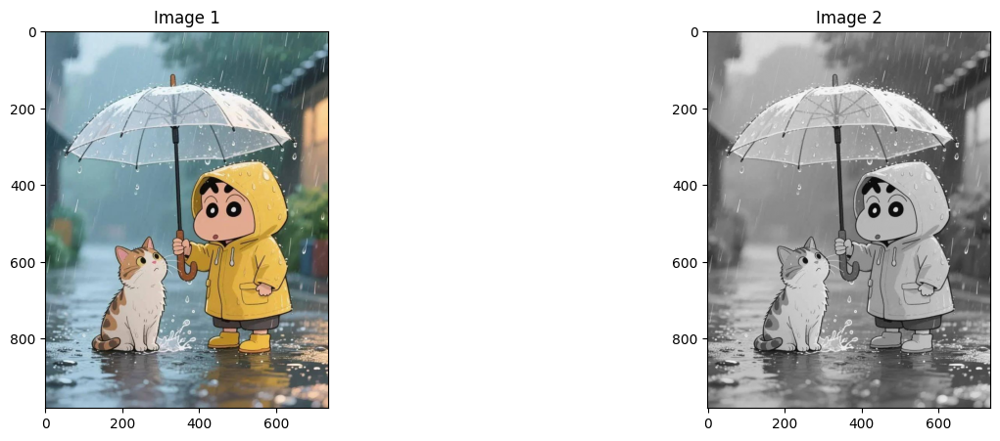

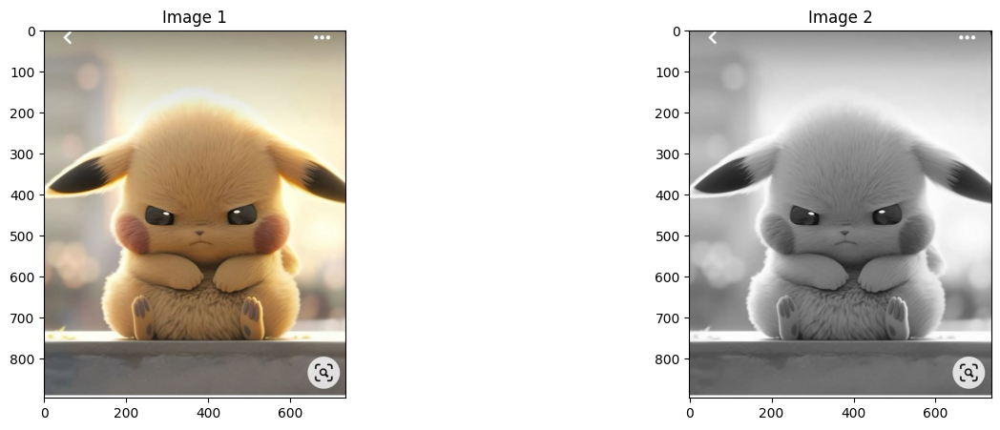

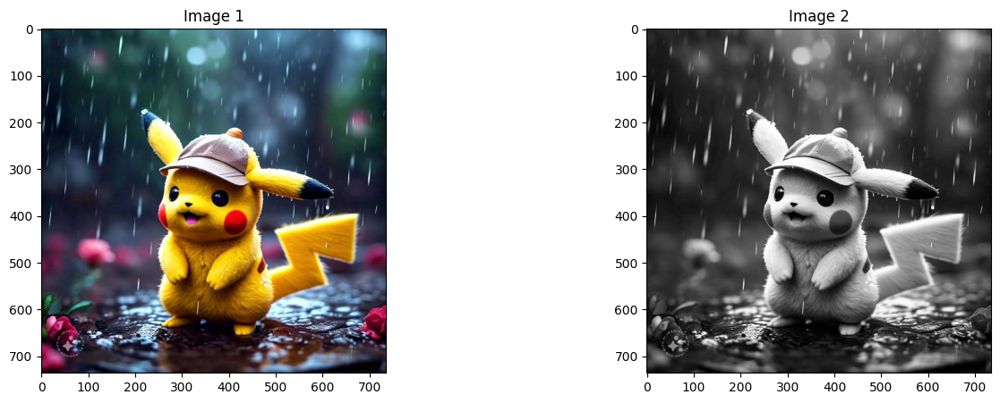

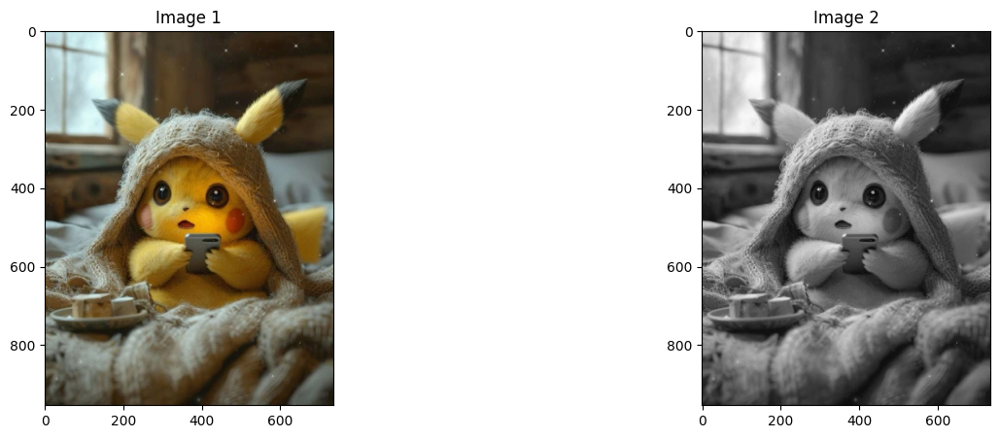

In [ ]:
img1 = cv.imread(img1_path)
img2 = cv.imread(img2_path)
img3 = cv.imread(img3_path)
img4 = cv.imread(img4_path)

img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)
img3 = cv.cvtColor(img3, cv.COLOR_BGR2RGB)
img4 = cv.cvtColor(img4, cv.COLOR_BGR2RGB)
img1_gray = cv.cvtColor(img1, cv.COLOR_RGB2GRAY)
img2_gray = cv.cvtColor(img2, cv.COLOR_RGB2GRAY)
img3_gray = cv.cvtColor(img3, cv.COLOR_RGB2GRAY)
img4_gray = cv.cvtColor(img4, cv.COLOR_RGB2GRAY)


ShowTwoImages(img1, img1_gray)
ShowTwoImages(img2, img2_gray)
ShowTwoImages(img3, img3_gray)
ShowTwoImages(img4, img4_gray)

## Convert original IMG to noise_IMG

### **Impulse noise**


- Impulse noise, commonly known as salt-and-pepper noise, is a type of noise that randomly replaces some pixel values in an image with either the maximum (white – “salt”) or minimum (black – “pepper”) intensity values.

- This noise typically occurs during image acquisition or transmission due to bit errors, faulty sensors, or data loss. As a result, the affected pixels appear as random black and white dots scattered over the image.

In [ ]:
def add_impulse_noise(image, prob):
    """
    Adds impulse (salt & pepper) noise to an image.

    Args:
    - image: Input image (numpy array).
    - prob: Probability of adding noise (0 < prob < 1).

    Returns:
    - noisy_img: Image with added noise.
    """
    # Create a copy of the original image to avoid modifying it directly
    noisy_img = image.copy()
    # Generate a random matrix with the same dimensions as the image
    random_matrix = np.random.rand(*image.shape[:2])

    # Add "salt" noise (white pixels)
    noisy_img[random_matrix < prob/2] = 255

    # Add "pepper" noise (black pixels)
    noisy_img[random_matrix > 1 - prob/2] = 0

    return noisy_img


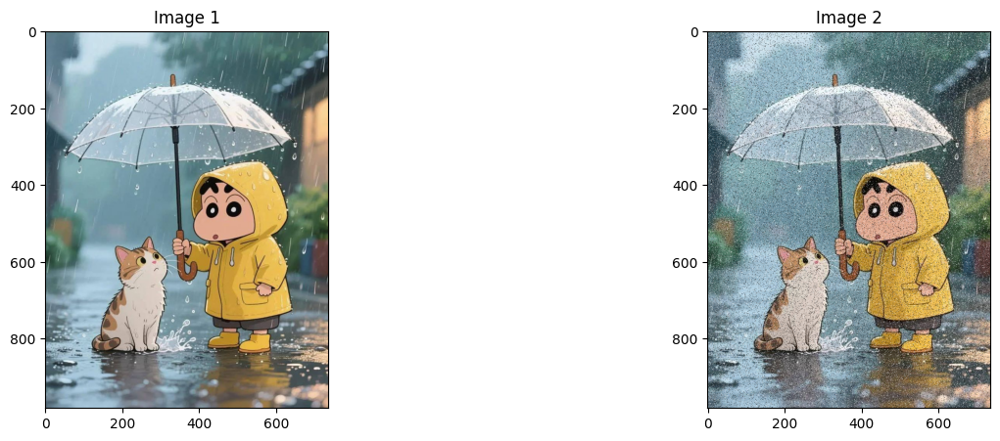

In [ ]:
 # Add impulse noise to the image
noisy_Impulse = add_impulse_noise(img1, prob=0.1)

# Display the original and noisy images using matplotlib
ShowTwoImages(img1, noisy_Impulse)

### **Gaussian noise**

- Gaussian noise is a type of statistical noise whose values follow a normal (Gaussian) distribution. It affects almost all pixels in an image by adding random variations in intensity values. This noise is common in digital images due to sensor thermal noise, low light conditions, or electronic circuit interference during image acquisition.

In [ ]:
def add_gaussian_noise(image, mean, sigma):
    """
    Adds Gaussian noise to an image.

    Args:
    - image: Input image (numpy array).
    - mean: Mean of the Gaussian distribution (default is 0).
    - sigma: Standard deviation of the Gaussian distribution (controls noise intensity).

    Returns:
    - noisy_img: Image with added Gaussian noise.
    """
    # Generate Gaussian noise
    gaussian_noise = np.random.normal(mean, sigma, image.shape).astype(np.float32)

    # Add the Gaussian noise to the image
    noisy_img = image.astype(np.float32) + gaussian_noise

    # Clip pixel values to be in the valid range [0, 255]
    noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)

    return noisy_img

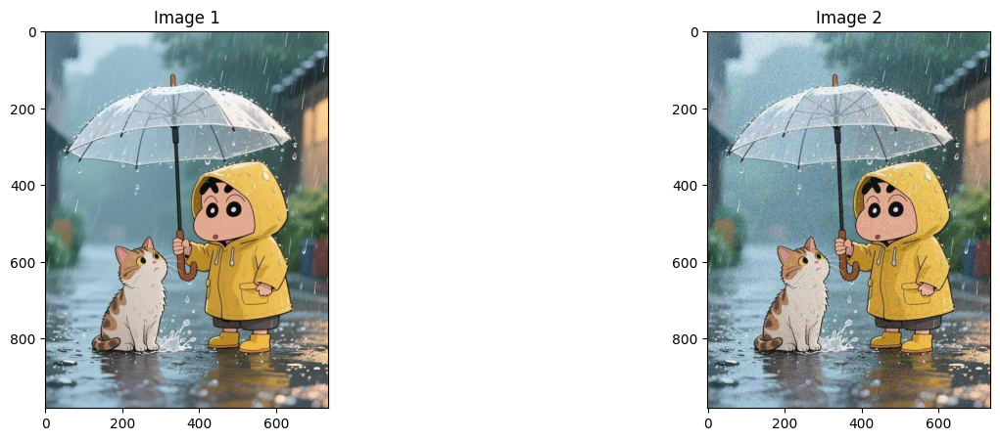

In [ ]:
noisy_Gaussian = add_gaussian_noise(img1,0,25)

ShowTwoImages(img1, noisy_Gaussian)

### **Speckle noise**

- Speckle noise is a type of multiplicative noise that typically appears in coherent imaging systems such as radar, sonar, ultrasound, and laser imaging.

- Unlike additive noise (e.g., Gaussian noise), speckle noise depends on the intensity of the original image — brighter regions are more affected than darker ones.

In [ ]:
def add_speckle_noise(image, sigma):
    """
    Adds speckle noise to an image.

    Args:
    - image: Input image (numpy array).
    - sigma: Standard deviation of the speckle noise (controls noise intensity).

    Returns:
    - noisy_img: Image with added speckle noise.
    """
    # Convert the image to float32 for accurate calculations
    image = image.astype(np.float32) / 255.0

    # Generate speckle noise (multiplicative noise)
    noise = np.random.randn(*image.shape) * sigma

    # Add the speckle noise to the image
    noisy_img = image + image * noise

    # Clip pixel values to the range [0, 1] and convert back to uint8
    noisy_img = np.clip(noisy_img, 0, 1)
    noisy_img = (noisy_img * 255).astype(np.uint8)

    return noisy_img

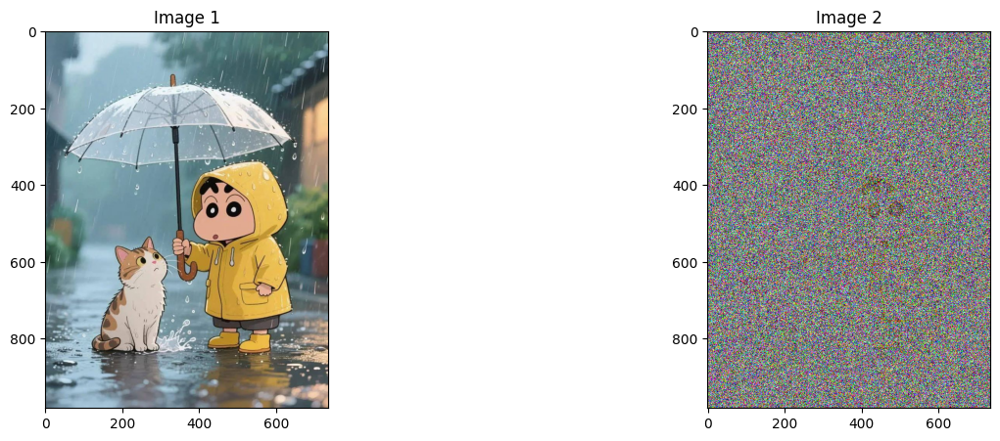

In [ ]:
noisy_speckle = add_speckle_noise(img1,50)

# Display the original and noisy images using matplotlib
ShowTwoImages(img1, noisy_speckle)

### **Uniform Noise**

- Uniform noise is a type of additive noise where the noise values are evenly distributed across a specific range.
- That means every intensity value within the range has an equal probability of occurring.
It is one of the simplest and most predictable noise models used in image processing experiments.

In [ ]:
def add_uniform_noise(img, noise_range):
    """
    Thêm nhiễu uniform vào ảnh đầu vào.

    Parameters:
        img (numpy.ndarray): Ảnh gốc (dạng mảng NumPy).
        noise_range (tuple): Khoảng giá trị nhiễu (min, max), thường nằm trong khoảng [-1, 1] nếu ảnh được chuẩn hóa.

    Returns:
        numpy.ndarray: Ảnh sau khi thêm nhiễu.
    """
    # Kiểm tra nếu ảnh có giá trị pixel từ 0 đến 255 thì chuẩn hóa về [0, 1]
    if img.dtype == np.uint8:
        img = img / 255.0

    # Tạo nhiễu uniform cùng kích thước với ảnh
    noise = np.random.uniform(low=noise_range[0], high=noise_range[1], size=img.shape)

    # Thêm nhiễu vào ảnh
    noisy_img = img + noise

    # Đảm bảo giá trị pixel nằm trong khoảng [0, 1]
    noisy_img = np.clip(noisy_img, 0, 1)

    # Chuyển ảnh về dạng uint8 nếu cần
    noisy_img = (noisy_img * 255).astype(np.uint8)

    return noisy_img

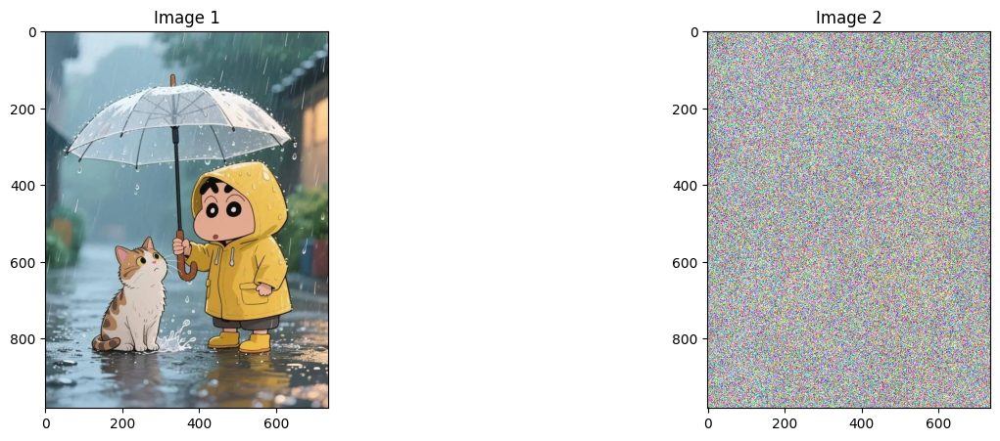

In [ ]:
noisy_uniform = add_uniform_noise(img1,(-5, 10))

# Display the original and noisy images using matplotlib
ShowTwoImages(img1, noisy_uniform)

## Filter

### Denoise

In [ ]:
noisy_Impulse1 = add_impulse_noise(img2, prob=0.1)
noisy_gaussian1 = add_gaussian_noise(img2, mean=0, sigma=60)

#### **Harmonic mean filter**

- The Harmonic Mean Filter is a spatial domain filtering technique used to reduce noise in digital images, particularly salt noise (bright dots).
- It is especially effective when the image is corrupted by impulse noise that affects high-intensity pixels.


In [ ]:
def harmonic_mean_filter(noisy_image, kernel_size):
    """
    Apply Harmonic Mean Filter to denoise an image channel-wise.

    Parameters:
    noisy_image (numpy array): Input noisy image (color).
    kernel_size (int): Size of the filter kernel. Default is 3.

    Returns:
    numpy array: Denoised color image.
    """
    # Initialize the output image with the same shape as the input
    denoised_image = np.zeros_like(noisy_image, dtype=np.float32)

    # Process each color channel separately
    for c in range(3):  # Loop over B, G, R channels
        # Padding to handle borders for each channel
        pad_size = kernel_size // 2
        padded_channel = cv.copyMakeBorder(noisy_image[:, :, c], pad_size, pad_size, pad_size, pad_size, cv.BORDER_REFLECT)

        # Traverse each pixel in the channel
        for i in range(pad_size, padded_channel.shape[0] - pad_size):
            for j in range(pad_size, padded_channel.shape[1] - pad_size):
                # Extract the local neighborhood (kernel window) for the current channel
                local_region = padded_channel[i - pad_size:i + pad_size + 1, j - pad_size:j + pad_size + 1]

                # Calculate harmonic mean in the kernel region, avoiding zero values to prevent division errors
                local_region = local_region.astype(np.float32)
                harmonic_mean = kernel_size * kernel_size / np.sum(1.0 / (local_region + 1e-10))

                # Assign the harmonic mean to the output image's channel
                denoised_image[i - pad_size, j - pad_size, c] = harmonic_mean

    # Convert the image back to 8-bit format
    denoised_image = np.clip(denoised_image, 0, 255).astype(np.uint8)

    return denoised_image

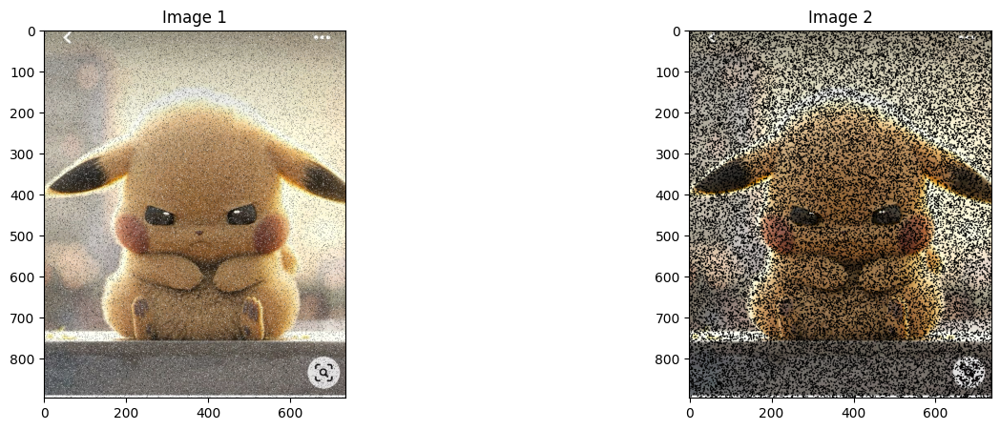

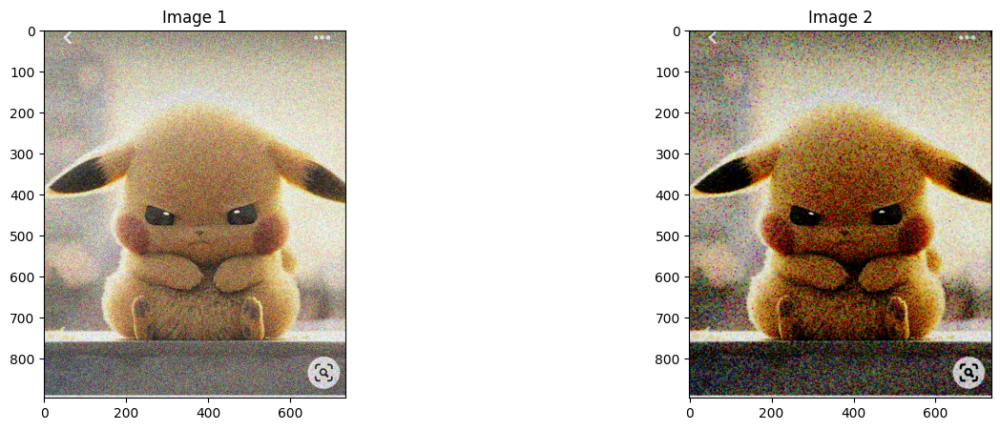

In [ ]:
harmonic_denoised1 = harmonic_mean_filter(noisy_Impulse1, kernel_size=3)
harmonic_denoised2 = harmonic_mean_filter(noisy_gaussian1, kernel_size=3)

ShowTwoImages(noisy_Impulse1, harmonic_denoised1)
ShowTwoImages(noisy_gaussian1, harmonic_denoised2)

#### **Geometric mean filter**

- The Geometric Mean Filter is a non-linear spatial filter used for image denoising and smoothing while preserving edge details more effectively than linear filters. Instead of calculating the arithmetic mean of pixel values within a local neighborhood, this filter computes the geometric mean, which reduces the influence of extreme pixel values caused by noise.

In [ ]:
def geometric_mean_filter(noisy_image, kernel_size):
    """
    Apply Geometric Mean Filter to denoise an image channel-wise.

    Parameters:
    noisy_image (numpy array): Input noisy image (color).
    kernel_size (int): Size of the filter kernel. Default is 3.

    Returns:
    numpy array: Denoised color image.
    """
    # Initialize the output image with the same shape as the input
    denoised_image = np.zeros_like(noisy_image, dtype=np.float32)

    # Process each color channel separately
    for c in range(3):  # Loop over B, G, R channels
        # Padding to handle borders for each channel
        pad_size = kernel_size // 2
        padded_channel = cv.copyMakeBorder(noisy_image[:, :, c], pad_size, pad_size, pad_size, pad_size, cv.BORDER_REFLECT)

        # Traverse each pixel in the channel
        for i in range(pad_size, padded_channel.shape[0] - pad_size):
            for j in range(pad_size, padded_channel.shape[1] - pad_size):
                # Extract the local neighborhood (kernel window) for the current channel
                local_region = padded_channel[i - pad_size:i + pad_size + 1, j - pad_size:j + pad_size + 1]

                # Calculate geometric mean, avoiding zero values with a small epsilon
                local_region = local_region.astype(np.float32) + 1e-10
                geometric_mean = np.exp(np.sum(np.log(local_region)) / (kernel_size * kernel_size))

                # Assign the geometric mean to the output image's channel
                denoised_image[i - pad_size, j - pad_size, c] = geometric_mean

    # Convert the image back to 8-bit format
    denoised_image = np.clip(denoised_image, 0, 255).astype(np.uint8)

    return denoised_image

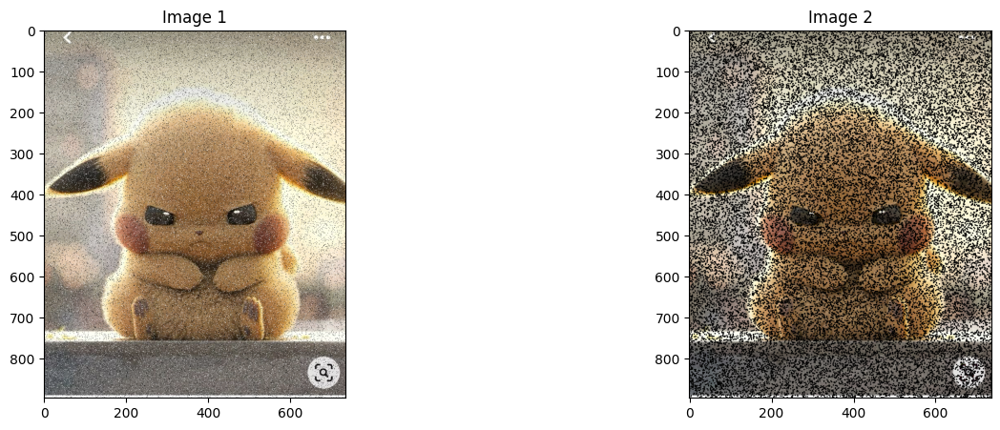

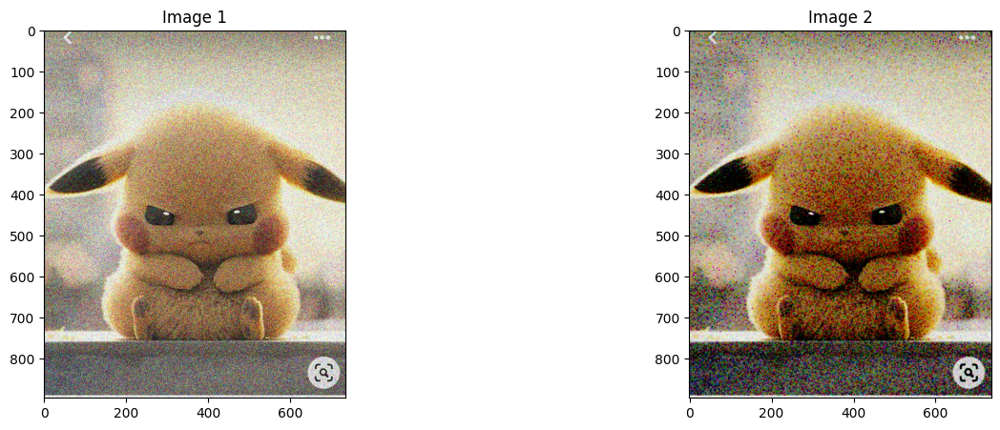

In [ ]:
# Apply Geometric Mean Filter on the color image
denoised_geometric1 = geometric_mean_filter(noisy_Impulse1, kernel_size=3)
denoised_geometric2 = geometric_mean_filter(noisy_gaussian1, kernel_size=3)

ShowTwoImages(noisy_Impulse1, denoised_geometric1)
ShowTwoImages(noisy_gaussian1, denoised_geometric2)

### Blur and Sharpen and edge detection

#### Blur

These are average smoothing kernels used for blurring or noise reduction.

Each pixel in the output image is replaced by the average value of its neighboring pixels within the kernel window.

- 3×3 produces mild blur.

- 5×5 produces stronger blur.

In [ ]:
Blur_kernel_3_3 = np.ones((3,3),np.float32)/9
Blur_kernel_5_5 = np.ones((5,5),np.float32)/25
print("Filtering Kernel 3x3:")
display(Blur_kernel_3_3)
print("Filtering Kernel 5x5:")
display(Blur_kernel_5_5)

image_filter_3_3_01 = cv.filter2D(img3,-1,Blur_kernel_3_3)
image_filter_3_3_02 = cv.filter2D(image_filter_3_3_01,-1,Blur_kernel_3_3)

image_filter_5_5_01 = cv.filter2D(img3,-1,Blur_kernel_5_5)
image_filter_5_5_02 = cv.filter2D(image_filter_5_5_01,-1,Blur_kernel_5_5)

Filtering Kernel 3x3:


array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]], dtype=float32)

Filtering Kernel 5x5:


array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

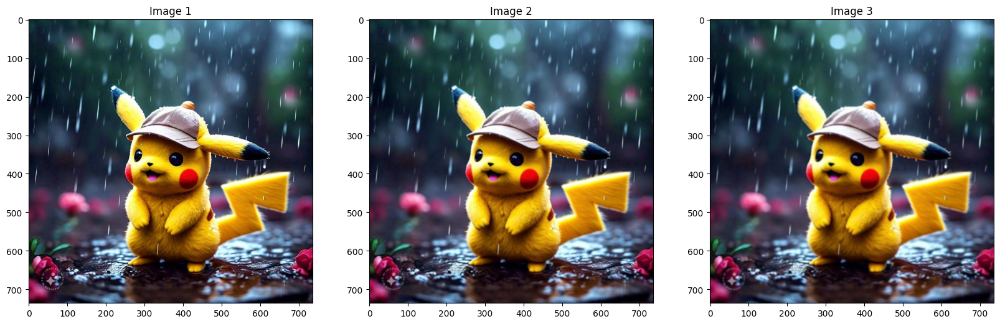

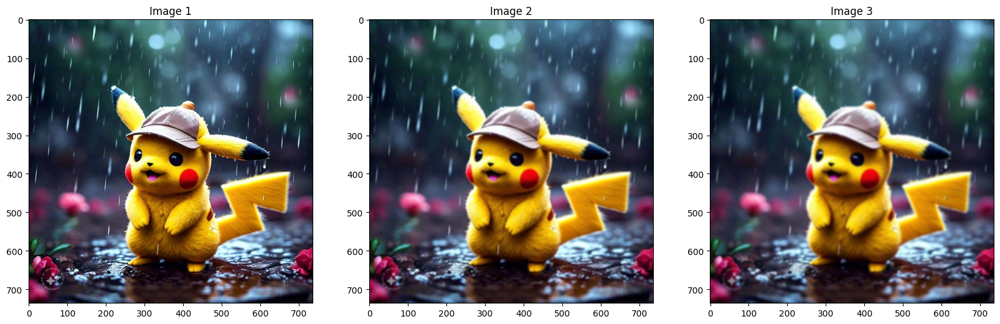

In [ ]:
ShowThreeImages(img3, image_filter_3_3_01, image_filter_3_3_02)
ShowThreeImages(img3, image_filter_5_5_01, image_filter_5_5_02)

- Laplacian Variance Method for Blur Measurement
This function calculates the variance of the Laplacian of an image to estimate its sharpness.

- A higher variance value indicates that the image has more edges and fine details (sharper),
while a lower variance suggests the image is smoother or blurred.

- This method is widely used in image processing to assess focus quality or detect blur.

In [ ]:
def variance_of_laplacian(image):
    # compute the Laplacian of the image and then return the focus
    # measure, which is simply the variance of the Laplacian
    return cv.Laplacian(image, cv.CV_64F).var()

In [ ]:
blur_mesurement = variance_of_laplacian(img3)
blur_mesurement_5_5_01 = variance_of_laplacian(image_filter_5_5_01)
blur_mesurement_5_5_02 = variance_of_laplacian(image_filter_5_5_02)
print("Blur Measurement of image_color:", blur_mesurement)
print("Blur Measurement of image_filter_5_5_01:", blur_mesurement_5_5_01)
print("Blur Measurement of image_filter_5_5_02:", blur_mesurement_5_5_02)

Blur Measurement of image_color: 543.2393749561758
Blur Measurement of image_filter_5_5_01: 21.13606104818161
Blur Measurement of image_filter_5_5_02: 7.4590658796002565


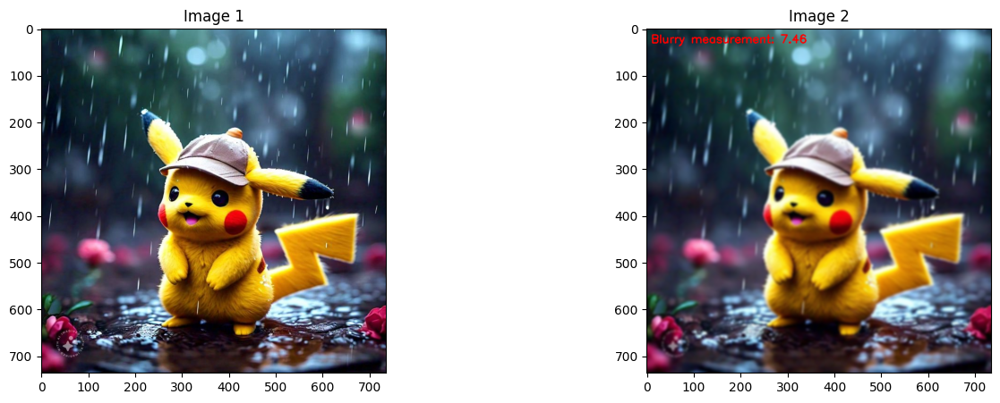

In [ ]:
text = "Blurry measurement"
fm = blur_mesurement_5_5_02
image_filter_5_5_02_text = image_filter_5_5_02.copy()
cv.putText(image_filter_5_5_02_text, "{}: {:.2f}".format(text, fm), (10, 30), cv.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
ShowTwoImages(img3, image_filter_5_5_02_text)

#### **Sharpen**

A strong sharpening filter that enhances edges by emphasizing the difference between each pixel and its neighbors.

It increases contrast at the edges, making objects appear clearer and more defined.

In [ ]:
kernel_sharpen_01 = np.array([[-1,-1,-1],
                              [-1, 9,-1],
                              [-1,-1,-1]])

kernel_sharpen_02 = np.array(([0, -1, 0],
                              [-1, 5, -1],
                              [0, -1, 0]), dtype="int")

print("Filtering kernel_sharpen_01:")
display(kernel_sharpen_01)

print("Filtering kernel_sharpen_02:")
display(kernel_sharpen_02)

image_color_sharpen_01 = cv.filter2D(img3, -1, kernel_sharpen_01)
image_gray_sharpen_01 = cv.filter2D(img3_gray, -1, kernel_sharpen_01)

image_color_sharpen_02 = cv.filter2D(img3, -1, kernel_sharpen_02)
image_gray_sharpen_02 = cv.filter2D(img3_gray, -1, kernel_sharpen_02)

Filtering kernel_sharpen_01:


array([[-1, -1, -1],
       [-1,  9, -1],
       [-1, -1, -1]])

Filtering kernel_sharpen_02:


array([[ 0, -1,  0],
       [-1,  5, -1],
       [ 0, -1,  0]])

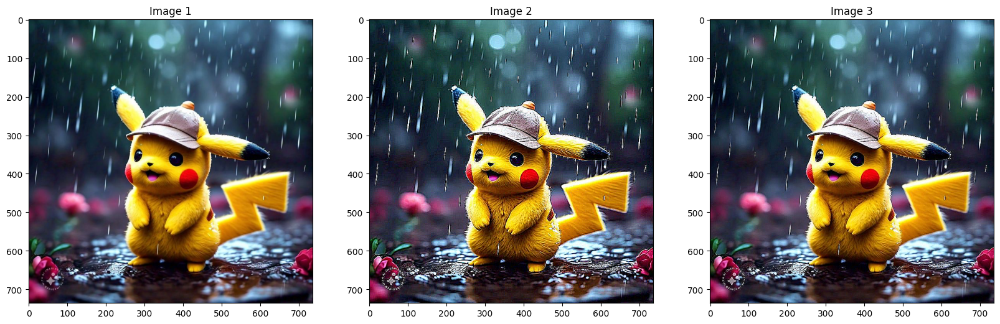

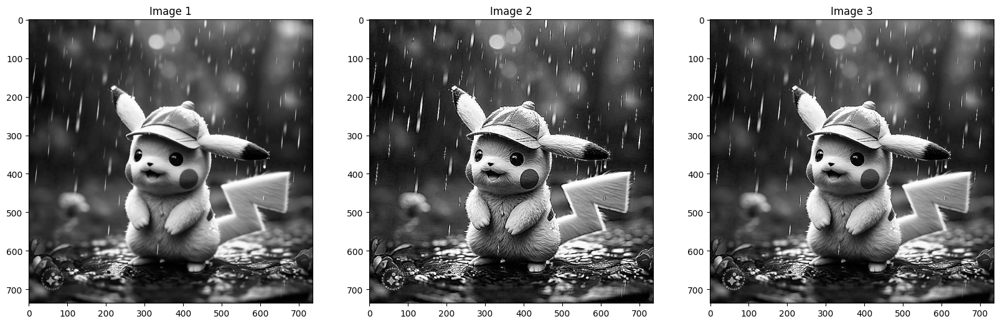

In [ ]:
ShowThreeImages(img3, image_color_sharpen_01, image_color_sharpen_02)
ShowThreeImages(img3_gray, image_gray_sharpen_01, image_gray_sharpen_02)

#### **Edge Detection**

The Sobel X kernel detects vertical edges by computing horizontal intensity gradients.
- It responds strongly to edges running vertically in the image (left–right transitions).

The Sobel Y kernel detects horizontal edges by computing vertical intensity gradients.
- It responds strongly to edges running horizontally (top–bottom transitions).



In [ ]:
# construct the Laplacian kernel used to detect edge-like
# regions of an image
# construct the Sobel x-axis kernel
kernel_sobelX = np.array((
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]), dtype="int")

# construct the Sobel y-axis kernel
kernel_sobelY = np.array((
    [-1, -2, -1],
    [0, 0, 0],
    [1, 2, 1]), dtype="int")

print("Filtering kernel_sobelX:")
display(kernel_sobelX)

print("Filtering kernel_sobelY:")
display(kernel_sobelY)

Filtering kernel_sobelX:


array([[-1,  0,  1],
       [-2,  0,  2],
       [-1,  0,  1]])

Filtering kernel_sobelY:


array([[-1, -2, -1],
       [ 0,  0,  0],
       [ 1,  2,  1]])

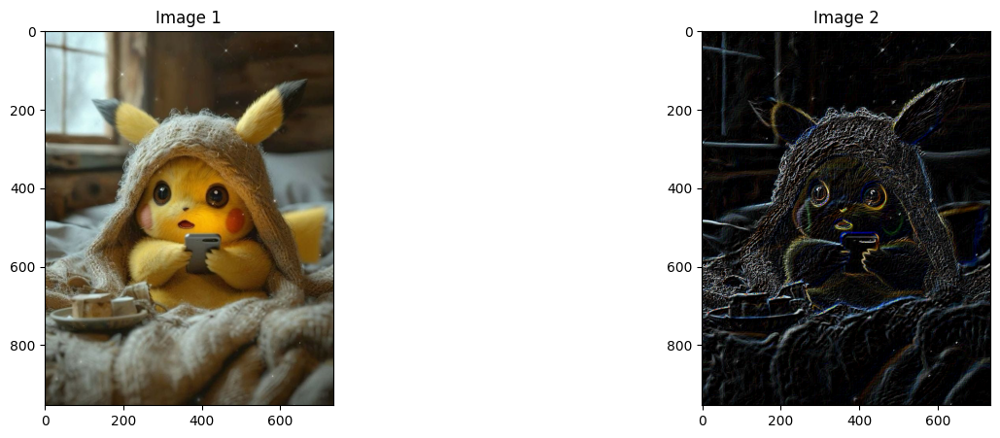

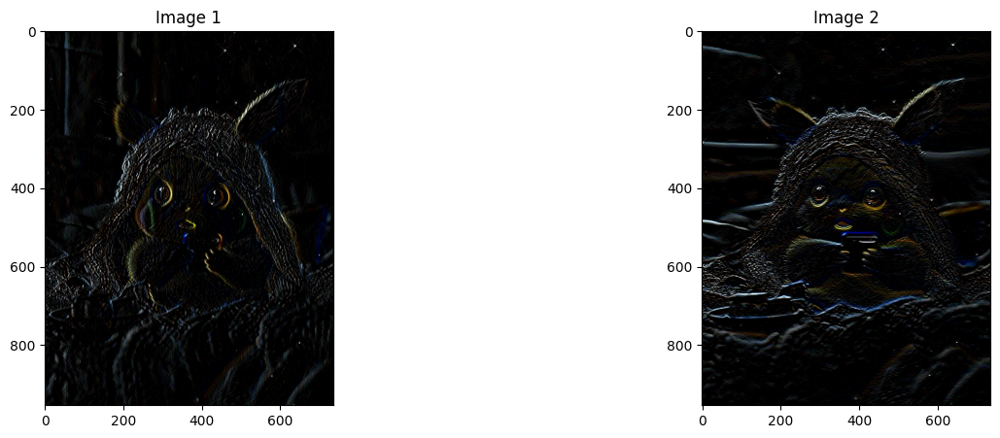

In [ ]:
image_color_edge_sobelX = cv.filter2D(img4, -1, kernel_sobelX)
image_color_edge_sobelY = cv.filter2D(img4, -1, kernel_sobelY)
image_color_edge = image_color_edge_sobelX + image_color_edge_sobelY

ShowTwoImages(img4, image_color_edge)
ShowTwoImages(image_color_edge_sobelX, image_color_edge_sobelY)

- Laplacian-like edge detection filter, emphasizing areas with rapid intensity changes.
- The center pixel has a large positive weight, while surrounding pixels have negative weights, making edges stand out.

In [ ]:
edge_kernel = np.array([[-1, -1, -1],
                        [-1,  8, -1],
                        [-1, -1, -1]], np.float32)
print("Filtering kernel_edge:")
display(edge_kernel)

Filtering kernel_edge:


array([[-1., -1., -1.],
       [-1.,  8., -1.],
       [-1., -1., -1.]], dtype=float32)

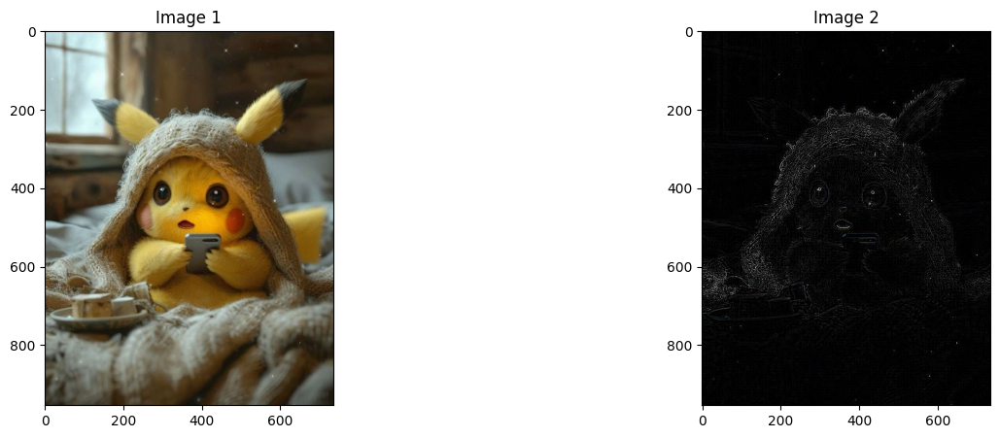

In [ ]:
image_color_edge = cv.filter2D(img4, -1, edge_kernel)
ShowTwoImages(img4, image_color_edge)

# Homework



## 1. Practice on Numerical Data

Task:
Use the noise generation function provided above and apply it to the following example:

```python
# Example data
data = np.array([10, 20, 30, 40, 50])
noisy_data = np.clip(noisy_data, 0, 1)
print("Data after adding noise:", noisy_data)
```

- Requirements:

  - Normalize the array data to the range [0, 1] before adding noise.


  - Ensure that all resulting values remain within [0, 1] after adding noise.

- Questions:

  - Try different noise ranges such as (-0.5, 0.5) and (-5, 10).

  - Record your observations about how the data changes under different noise levels.


## 2. Practice on Images

Task:
  - Use an external image and apply the noise generation functions covered earlier.

    - Experiment with different parameter values for the noise functions.

    - Plot histograms of both the original image and the noisy images.

    - Write short observations about the differences between the original and noisy images.

  - Add Gaussian, Salt & Pepper, Speckle, and Poisson noise to the same image with different intensity levels.

    - Plot histograms and compare their shapes.

    - How does each noise type affect bright and dark regions differently?

    - Which type of noise is more perceptually noticeable?


## 3. Harmonic Mean and Geometric Mean Filters

  - Find an image from the internet and perform the following steps:

    - Add noise to the image using the previously introduced noise methods.

    - Apply Harmonic Mean Filter and Geometric Mean Filter with kernel sizes 3×3 and 5×5.

    - Compare the denoising results and write short
    comments:

      - Which type of noise is reduced effectively?

      - Which type of noise remains unaffected?

      - Explain why these filters perform better or worse depending on the noise type.

## 4. Applying Basic Convolution Filters

Task:
Choose an image from the internet and perform the following operations:

- Apply blurring filters with kernel sizes 3×3 and 5×5. Compute and display the blur measurement value for each filtered image. Overlay the blur value text directly on the image.

- Apply sharpening filters. Compute and display the sharpness measurement value for each image. Overlay the sharpness value text on the image.

- Additional Tasks:

  - Define a blur threshold based on the blur measurement values.

  - For each image:

    - If the image exceeds the blur threshold → add the label “Blur Image: [value]”.

    - Otherwise → label the image as “Good Image”.

    - Save all evaluated images into a folder named “Image_BlurDetection_Output”.


  - Apply edge detection filters and describe their purpose and visual meaning.

## 5. Report

- Display the original image and all transformed images.

- Write a short commentary comparing the visual differences between them and describe what you observe from each transformation.

In [1]:

# Task:
# Use the noise generation function provided above and apply it to the following example:

# ```python
# # Example data
# data = np.array([10, 20, 30, 40, 50])
# noisy_data = np.clip(noisy_data, 0, 1)
# print("Data after adding noise:", noisy_data)
# ```

# - Requirements:

#   - Normalize the array data to the range [0, 1] before adding noise.

#   - Ensure that all resulting values remain within [0, 1] after adding noise.

# - Questions:

#   - Try different noise ranges such as (-0.5, 0.5) and (-5, 10).

#   - Record your observations about how the data changes under different noise levels.

data = np.array([10, 20, 30, 40, 50])
data_normalized = data / max(data)
noisy_data_1 = add_uniform_noise(data_normalized, (-0.5, 0.5))
noisy_data_2 = add_uniform_noise(data_normalized, (-5, 10))
noisy_data_1_clipped = np.clip(noisy_data_1, 0, 1)
noisy_data_2_clipped = np.clip(noisy_data_2, 0, 1)
print("Data after adding noise with range (-0.5, 0.5):", noisy_data_1_clipped)
print("Data after adding noise with range (-5, 10):", noisy_data_2_clipped)

NameError: name 'np' is not defined